<a href="https://colab.research.google.com/github/zuvelatamara/PPPO/blob/main/Vezbe07.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Vežbe 07** Segmentacija fotografije

## Sadržaj

1. Uvod
2. Segmentacija putem *Thresholding Ots-u* i *Thresholding Riddler-Calvard*
3. Segmentacija fotografija pomoću SOM-a
4. *RandomWalk* segmentacija pomoću *scikit-image*
5. Detekcija i segmentacija boje kože pomoću Gaussovog modela smeše
6. Segmentacija medicinske fotografije
7. Semantička segmentacija

### Uvod

Segmentacija fotografije se odnosi na podelu fotografije na različite regione ili kategorije, pri čemu svaka regija sadrži piksele sa sličnim atributima, a svaki piksel na fotografiji dodeljuje se jednoj od ovih kategorija.


Segmentacija fotografije se obično koristi radi pojednostavljivanja predstavljanja fotografije u segmentima koji su značajniji i lakši za analizu. Ako je segmentacija dobro izvedena, onda su sve druge faze u analizi fotografije pojednostavljene, što znači da kvalitet i pouzdanost segmentacije diktiraju da li će analiza fotografije biti uspešna. Podela fotografije na ispravne segmente često je vrlo izazovan problem.


!!! Promeniti runtime type
**Runtime->Change runtime type->**(Hardware accelerator=GPU)

Učitavanje dataseta potrebnog za ove vežbe
- učitati images.zip

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1rgrxEfodeQWF__08tFNBGrST3UxWHPao' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1rgrxEfodeQWF__08tFNBGrST3UxWHPao" -O images.zip && rm -rf /tmp/cookies.txt

--2021-04-20 08:14:47--  https://docs.google.com/uc?export=download&confirm=Ptu7&id=1rgrxEfodeQWF__08tFNBGrST3UxWHPao
Resolving docs.google.com (docs.google.com)... 172.217.13.238, 2607:f8b0:4004:832::200e
Connecting to docs.google.com (docs.google.com)|172.217.13.238|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-08-6c-docs.googleusercontent.com/docs/securesc/8180an4b89ubu57c37v9srnvuhf1drss/eph6o3ji3cmjje06eqnlt8hkn108hjjl/1618906425000/07050430151874469418/10957114933066669254Z/1rgrxEfodeQWF__08tFNBGrST3UxWHPao?e=download [following]
--2021-04-20 08:14:47--  https://doc-08-6c-docs.googleusercontent.com/docs/securesc/8180an4b89ubu57c37v9srnvuhf1drss/eph6o3ji3cmjje06eqnlt8hkn108hjjl/1618906425000/07050430151874469418/10957114933066669254Z/1rgrxEfodeQWF__08tFNBGrST3UxWHPao?e=download
Resolving doc-08-6c-docs.googleusercontent.com (doc-08-6c-docs.googleusercontent.com)... 172.217.12.225, 2607:f8b0:4004:807::2001
Connecting to doc-0

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=10MhrHS8tm4mOQlQMghD8ygpLztPUihx9' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=10MhrHS8tm4mOQlQMghD8ygpLztPUihx9" -O models.zip && rm -rf /tmp/cookies.txt

--2021-04-20 08:14:51--  https://docs.google.com/uc?export=download&confirm=BqUQ&id=10MhrHS8tm4mOQlQMghD8ygpLztPUihx9
Resolving docs.google.com (docs.google.com)... 142.250.65.78, 2607:f8b0:4004:832::200e
Connecting to docs.google.com (docs.google.com)|142.250.65.78|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-00-7s-docs.googleusercontent.com/docs/securesc/29ojubosnbeonp42edjdg5m4f9kdjeqc/2u2e9ubmdcmlij2v1rgaschuiojmqv37/1618906425000/07050430151874469418/17765684844409326700Z/10MhrHS8tm4mOQlQMghD8ygpLztPUihx9?e=download [following]
--2021-04-20 08:14:51--  https://doc-00-7s-docs.googleusercontent.com/docs/securesc/29ojubosnbeonp42edjdg5m4f9kdjeqc/2u2e9ubmdcmlij2v1rgaschuiojmqv37/1618906425000/07050430151874469418/17765684844409326700Z/10MhrHS8tm4mOQlQMghD8ygpLztPUihx9?e=download
Resolving doc-00-7s-docs.googleusercontent.com (doc-00-7s-docs.googleusercontent.com)... 172.217.12.225, 2607:f8b0:4004:807::2001
Connecting to doc-00-

Unzip dataseta

In [ ]:
!unzip images.zip

Archive:  images.zip
   creating: images/
 extracting: images/1_13_s.png       
  inflating: images/1_13_s_GT.png    
 extracting: images/apples.png       
  inflating: images/atlas_slicez90.nii.gz  
  inflating: images/b0.png           
  inflating: images/b0_label_out.png  
  inflating: images/bird.png         
  inflating: images/bird_SLIC_RAG.png  
 extracting: images/board.png        
  inflating: images/board_threshold_out.png  
  inflating: images/bone_segmentation_out.png  
  inflating: images/ckmeans_out1.png  
  inflating: images/ckmeans_out2.png  
  inflating: images/ckmeans_out3.png  
  inflating: images/cls_prob_dist.png  
  inflating: images/clustering.png   
  inflating: images/cmeans_out1.png  
  inflating: images/cmeans_out2.png  
 extracting: images/complex.png      
  inflating: images/connectivity.png  
  inflating: images/CT_bones.png     
 extracting: images/CT_bones_mask.png  
  inflating: images/cycling.png      
 extracting: images/earth_by_MCC.png  
 extractin

In [ ]:
!unzip models.zip

Archive:  models.zip
   creating: models/
  inflating: models/fcn8s-heavy-pascal.prototxt  
  inflating: models/frozen_inference_graph.pb  
  inflating: models/mask_rcnn_inception_v2_coco_2018_01_28.pbtxt  
  inflating: models/model.json       
  inflating: models/object_detection_classes_coco.txt  
  inflating: models/pascal-classes.txt  
  inflating: models/weights-core-best.h5  
  inflating: models/weights-ET-best.h5  
  inflating: models/weights-full-best.h5  


### Segmentation by Thresholding with Otsu and Riddler-Calvard // Segmentacija putem *Thresholding Ots-u* i *Thresholding Riddler-Calvard*


*Thresholding* se odnosi na porodicu algoritama koji koriste vrednost piksela kao **prag** za stvaranje binarne fotografije (fotografija sa samo crno-belim pikselima) od fotografije u sivim tonovima (ovo je najjednostavniji mogući metod, segmentiranje objekata u prvom planu iz pozadine na fotografiji).

Prag se može odabrati ručno (gledanjem histograma vrednosti piksela) ili automatski pomoću algoritma. Tehnike segmentacije fotografije mogu biti nekontekstualne (bez razmatranja prostornih odnosa između obeležja na fotografiji i grupisanja piksela samo s obzirom na određene globalne atribute - na primer, nivo boje/sive boje) ili kontekstualne (dodatno iskorišćavanje prostornih odnosa).

Prikazaćemo nekoliko popularnih metoda graničenja zasnovanih na histogramu poznatih kao Otsu-ove (uz pretpostavku bimodalnog histograma) i Riddler-Calvardove metode koristeći funkcije biblioteke *mahotas*.

Koristeći **Otsu** metodu, za svaku moguću vrednost praga izračunava se ponderisana varijansa unutar klase između dve klase piksela (odvojena tom vrednošću praga). Optimalni prag je onaj koji minimalizuje ovu varijansu, kao što je prikazano na sledećem dijagramu:


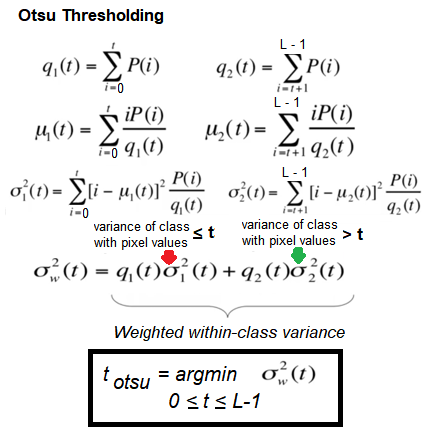

**Riddler-Calvard** metoda automatski bira (optimalni) prag kao rezultat iterativnog procesa koji obezbeđuje postupno čistije izdvajanje područja objekta nakon niza ponavljanja.

Thresholding funkcije imaju trivijalni interfejs u *​​mahotas* biblioteci: uzimaju fotografiju i vraćaju vrednost.
- Funkcija *otsu()* je korišćena za izračunavanje optimalnog Ots-u praga za ulaznu fotografiju.
- Funkcija *rc()* je korišćena za izračunavanje praga Riddler-Calvard za datu ulaznu fotografiju.

Svim pikselima čija je vrednost manja ili jednaka optimalnom pragu dodeljuje se vrednost nula (crni objekat u prvom planu), a onima sa vrednostima iznad njega dodeljuje se vrednost jedan (bela pozadina), da bi se dobila izlazna binarna fotografija za svaki od dva algoritma.


In [ ]:
!pip install mahotas

     |████████████████████████████████| 5.7MB 21.3MB/s 


161 161.5062276206947


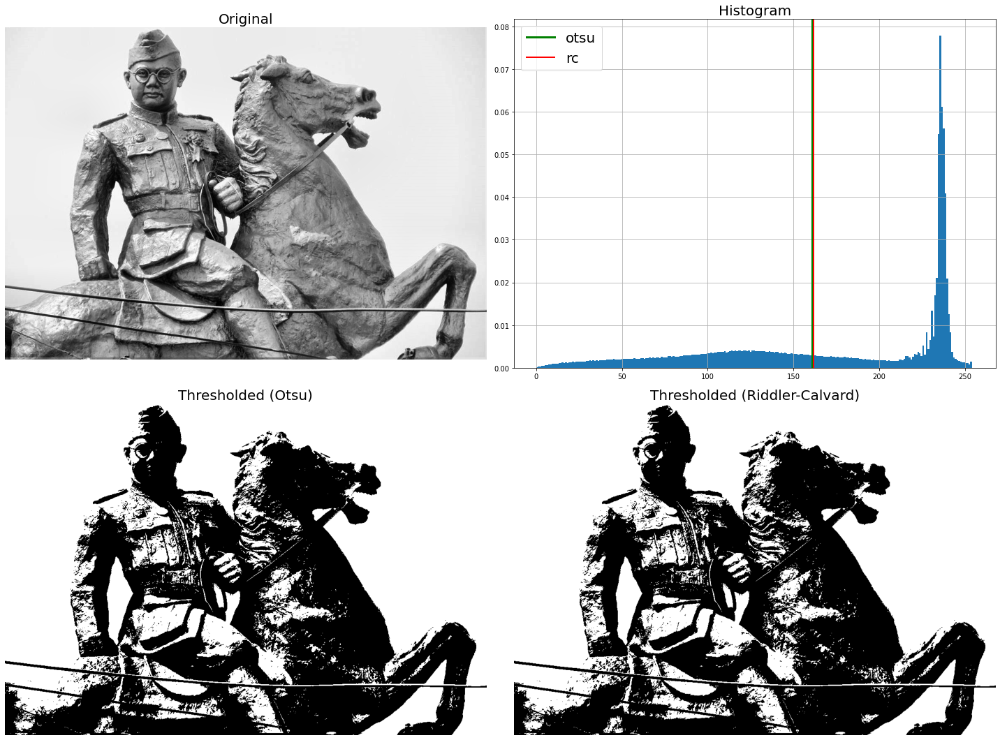

In [ ]:
# Omogućava prikazivanje grafika direktno u Jupyter notebook-u (ako koristite Jupyter).
%matplotlib inline

# Uvoz biblioteka potrebnih za obradu slike i vizualizaciju.
import mahotas as mh  # Biblioteka za obradu slika sa podrškom za različite algoritme segmentacije.
import numpy as np    # Biblioteka za numeričke operacije.
import matplotlib.pylab as plt  # Biblioteka za kreiranje grafika.

"""
Prvo pročitajte fotografiju i koristite funkcije biblioteke mahotas da biste dobili optimalne pragove
za ulaznu fotografiju sive skale pomoću sledećeg isečka koda.
Kao što vidite, pragovi dobijeni sa dva gore navedena algoritma prilično su blizu jedan drugom za datu ulaznu fotografiju.
"""

# Učitajte ulaznu sliku iz direktorijuma (pretpostavlja se da je slika u grayscale formatu).
image = mh.imread('images/netaji.png')

# Izračunavanje praga slike pomoću Otsu i Riddler-Calvard algoritama.
thresh_otsu, thresh_rc = mh.otsu(image), mh.rc(image)

# Ispisuje vrednosti praga izračunate Otsu i Riddler-Calvard algoritmima.
print(thresh_otsu, thresh_rc)  # Na primer, 161 i 161.5062276206947

"""
Izvršite binarnu segmentaciju ulazne fotografije koristeći optimalne pragove dobijene za vrednosti piksela.
Dobićete dve različite binarne izlazne fotografije, koje odgovaraju algoritmima:
"""

# Primena binarne segmentacije na osnovu praga Otsu algoritma.
binary_otsu = image > thresh_otsu

# Primena binarne segmentacije na osnovu praga Riddler-Calvard algoritma.
binary_rc = image > thresh_rc

"""
Nacrtajte ulaznu fotografiju, histogram ulazne fotografije,
izračunate pragove i izlazne fotografije:
"""

# Kreiranje podgrafa sa 2 reda i 2 kolone za prikazivanje rezultata.
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 15))  # Podešavanje veličine grafa.
axes = axes.ravel()  # Pretvaranje matrice osa u jedan niz radi lakšeg pristupa.

# Prikaz originalne ulazne slike u sivim nijansama.
axes[0].imshow(image, cmap=plt.cm.gray)
axes[0].set_title('Original', size=20)  # Postavljanje naslova za graf.
axes[0].axis('off')  # Isključivanje osa na grafu.

# Prikaz histograma vrednosti piksela ulazne slike.
axes[1].hist(image.ravel(), bins=256, density=True)  # Kreiranje histograma sa 256 binova.
axes[1].set_title('Histogram', size=20)  # Postavljanje naslova za graf.

# Dodavanje vertikalnih linija koje prikazuju izračunate pragove na histogramu.
axes[1].axvline(thresh_otsu, label='otsu', color='green', lw=3)  # Linija za Otsu prag.
axes[1].axvline(thresh_rc, label='rc', color='red', lw=2)  # Linija za Riddler-Calvard prag.

# Dodavanje legende i mreže na histogram.
axes[1].legend(loc='upper left', prop={'size': 20})  # Legenda sa opisima pragova.
axes[1].grid()  # Uključivanje mreže na grafu.

# Prikaz slike nakon segmentacije korišćenjem Otsu praga.
axes[2].imshow(binary_otsu, cmap=plt.cm.gray)
axes[2].set_title('Thresholded (Otsu)', size=20)  # Postavljanje naslova za graf.
axes[2].axis('off')  # Isključivanje osa na grafu.

# Prikaz slike nakon segmentacije korišćenjem Riddler-Calvard praga.
axes[3].imshow(binary_rc, cmap=plt.cm.gray)
axes[3].set_title('Thresholded (Riddler-Calvard)', size=20)  # Postavljanje naslova za graf.
axes[3].axis('off')  # Isključivanje osa na grafu.

# Automatsko podešavanje razmaka između grafova radi boljeg prikaza.
plt.tight_layout()

# Prikazivanje svih grafika.
plt.show()

### Image segmentation with Self Organizing Maps (SOM) // // Segmentacija fotografija pomoću SOM-a


Mapa samoorganizacije (SOM) je konkurentna mreža za učenje (zanimljiva klasa mašinskog učenja bez nadzora). Predstavlja jedan od najpopularnijih modela neuronskih mreža.

U ovoj mreži se samo jedan neuron aktivira u datom trenutku, pa se izlazni neuroni takmiče među sobom da li će biti aktivirani. Ovaj aktivirani neuron naziva se pobednički neuron. Kada jedan neuron puca, njegovi najbliži susedi imaju tendenciju da se uzbude više od onih koji su dalje (definišući topološko susedstvo sa razdaljinom).
Kao rezultat, neuroni su prisiljeni da se organizuju (kroz adaptivni proces ili proces učenja) i kreira se karta karakteristika između ulaza i izlaza. Zbog toga je ova mreža poznata kao samoorganizujuća mapa.

Adaptivni proces SOM algoritma odvija se u sledeća dva koraka:
1. Faza naručivanja (samoorganizovanja): U ovoj fazi se dešava topološko uređenje vektora težine.
To obično traje oko 1000 ponavljanja.
2. Faza konvergencije: U ovoj fazi karta karakteristika je fino podešena i formira tačnu statističku kvantifikaciju ulaznog prostora.
Tipično je potrebno najmanje toliko ponavljanja kao 500 puta veći broj neurona.

SOM se može koristiti za klasterisanje podataka kada oznake klasa nisu dostupne.

Takođe je poznata i kao samoorganizujuća mapa karakteristika (SOFM), jer se može koristiti za otkrivanje karakteristika koje su svojstvene problemu. Jedinice mape (neuroni) obično čine dvodimenzionalnu rešetku, a to obezbeđuje mapiranje koje zadržava topologiju iz visokodimenzionalnog prostora na ravan.
SOM model takođe ima mogućnost generalizacije, gde se nova tačka podataka asimilira neuronom na koji se preslikava.

Prikazaćemo segmentaciju fotografije kvantizacijom boja pomoću SOM sa Python bibliotekom *minisom*.

- Funkcija *train_random()* koristi se za treniranje SOM-a odabirom nasumičnih uzoraka piksela iz (spljoštenih) podataka o fotografiji. Zajedno sa ulaznom fotografijom, prihvata i drugi parametar, *num_iteration*, koji označava maksimalan broj iteracija (jedna iteracija po uzorku piksela).
- Funkcija kvantizacije se koristi za dodeljivanje knjige šifara (vektor pondera pobedničkog neurona) svakom pikselu koja na taj način vrši kvantizaciju boje.


In [ ]:
!pip install minisom

  Created wheel for minisom: filename=MiniSom-2.2.8-cp37-none-any.whl size=8604 sha256=43c638d500777b66e5e8719396229123b6013aa834975ed1ca09336e90052fc4
  Stored in directory: /root/.cache/pip/wheels/78/7e/a8/435947263149d3b94fa65339751f8c65617c436b0bdfb29c7d
Successfully built minisom


training...
quantization...
building new image...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: DeprecationWarning: 'shape' argument should be used instead of 'dims'


done.


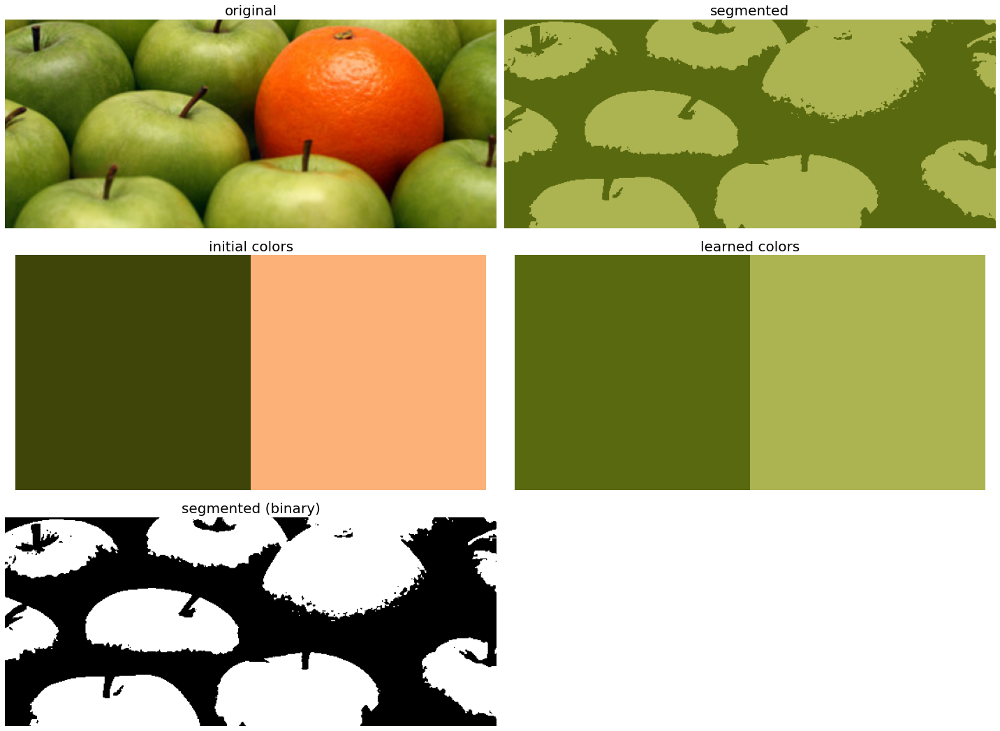

training...
quantization...
building new image...
done.


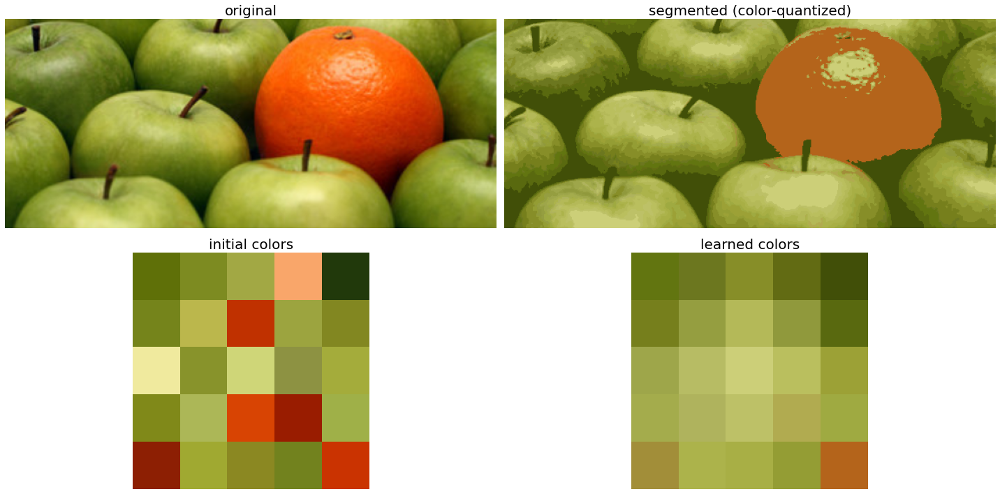

In [ ]:
# Uvoz potrebnih biblioteka
from minisom import MiniSom  # Biblioteka za samoorganizujuće mape (Self-Organizing Maps - SOM).
from skimage import img_as_float  # Funkcija za normalizaciju slika na opseg vrednosti [0, 1].
import numpy as np  # Biblioteka za rad sa numeričkim podacima.
import matplotlib.pyplot as plt  # Biblioteka za vizualizaciju.

"""
Definicija funkcije za segmentaciju RGB slike pomoću SOM-a.
Funkcija pretvara sliku u niz piksela, trenira SOM mrežu i koristi je za kvantizaciju slike.
"""
def segment_with_SOM(image, nx, ny, sigma=1., n=500):
    # Pretvaranje slike u niz gde svaki red predstavlja RGB vrednosti jednog piksela.
    pixels = np.reshape(image, (image.shape[0] * image.shape[1], 3))

    # Inicijalizacija SOM mreže.
    print('training...')  # Poruka za praćenje napretka.
    som = MiniSom(x=nx, y=ny, input_len=3, sigma=sigma, learning_rate=0.2)  # nx x ny neurona, svaki sa 3 ulaza (RGB).
    som.random_weights_init(pixels)  # Inicijalizacija težina SOM-a na osnovu ulaznih podataka.
    starting_weights = som.get_weights().copy()  # Čuvanje početnih težina za vizualizaciju.

    # Treniranje SOM mreže sa slučajnim pikselima.
    som.train_random(pixels, n)  # Trening sa n slučajno odabranih piksela.

    """
    Nakon treninga, koristimo SOM za kvantizaciju ulaznih piksela.
    Ovo zamenjuje svaku originalnu RGB vrednost sa najbližim vektorom težina iz SOM-a.
    """
    print('quantization...')  # Poruka za praćenje napretka.
    qnt = som.quantization(pixels)  # Kvantizacija svih piksela na osnovu težina neurona.

    """
    Kreiranje nove slike sa kvantizovanim RGB vrednostima.
    Zamena originalnih vrednosti piksela kvantizovanim vrednostima.
    """
    print('building new image...')  # Poruka za praćenje napretka.
    clustered = np.zeros(image.shape)  # Kreiranje prazne slike sa istim dimenzijama kao original.
    for i, q in enumerate(qnt):  # Popunjavanje nove slike kvantizovanim vrednostima.
        clustered[np.unravel_index(i, dims=(image.shape[0], image.shape[1]))] = q

    print('done.')  # Indikacija završetka.
    final_weights = som.get_weights()  # Čuvanje finalnih težina za vizualizaciju.
    return clustered, starting_weights, final_weights  # Povrat nove slike i težina.

"""
Učitavanje ulazne slike i primena funkcije za segmentaciju sa SOM mrežom.
U ovom primeru koristi se mreža sa 2 neurona (1x2) za segmentaciju slike u dva klastera.
"""
image = img_as_float(plt.imread('images/apples.png'))  # Učitavanje slike i normalizacija.
clustered, starting_weights, final_weights = segment_with_SOM(image, 1, 2, .1)  # Segmentacija slike.

# Priprema binarne verzije segmentisane slike.
colors = np.unique(clustered.reshape(-1, 3), axis=0)  # Dobijanje jedinstvenih boja iz segmentisane slike.
clustered_binary = np.zeros_like(clustered)  # Kreiranje binarne slike sa istim dimenzijama.
clustered_binary[np.where((clustered[..., 0] == colors[1][0]) & \
                          (clustered[..., 1] == colors[1][1]) & \
                          (clustered[..., 2] == colors[1][2]))] = 1.  # Postavljanje piksela u binarnu sliku.

# Vizualizacija rezultata segmentacije sa mrežom 1x2.
plt.figure(figsize=(20, 15))
plt.subplot(321), plt.title('original', size=20), plt.axis('off'), plt.imshow(image)  # Originalna slika.
plt.subplot(322), plt.title('segmented', size=20), plt.axis('off'), plt.imshow(clustered)  # Segmentisana slika.
plt.subplot(323), plt.title('initial colors', size=20), plt.axis('off'), plt.imshow(starting_weights, interpolation='none')  # Početne težine.
plt.subplot(324), plt.title('learned colors', size=20), plt.axis('off'), plt.imshow(final_weights, interpolation='none')  # Naučene težine.
plt.subplot(325), plt.title('segmented (binary)', size=20), plt.axis('off'), plt.imshow(clustered_binary)  # Binarna verzija segmentacije.
plt.tight_layout()
plt.show()

# Ponovljena segmentacija sa mrežom 5x5 za više klastera.
clustered, starting_weights, final_weights = segment_with_SOM(image, 5, 5)  # Segmentacija sa više neurona.

# Vizualizacija rezultata segmentacije sa mrežom 5x5.
plt.figure(figsize=(20, 10))
plt.subplot(221), plt.title('original', size=20), plt.axis('off'), plt.imshow(image)  # Originalna slika.
plt.subplot(222), plt.title('segmented (color-quantized)', size=20), plt.axis('off'), plt.imshow(clustered)  # Segmentisana slika.
plt.subplot(223), plt.title('initial colors', size=20), plt.axis('off'), plt.imshow(starting_weights, interpolation='none')  # Početne težine.
plt.subplot(224), plt.title('learned colors', size=20), plt.axis('off'), plt.imshow(final_weights, interpolation='none')  # Naučene težine.
plt.tight_layout()
plt.show()

### RandomWalk Segmentation with scikit-image // *RandomWalk* segmentacija pomoću *scikit-image*


*RandomWalk* segmentacija je interaktivna, višeznačna metoda segmentacije fotografija. Počinje sa nekoliko početnih piksela sa korisnički definisanim oznakama, a zatim se za svaki neobeleženi piksel izračunava verovatnoća da će slučajni šetač koji počinje od tog određenog piksela prvo doći do jednog od prethodno obeleženih piksela. Tada se neobeleženom pikselu dodeljuje oznaka koja odgovara većoj od vrednosti verovatnoće (označavajući verovatnoću da će doći prvi).

To rezultira visokokvalitetnom segmentacijom fotografije. Sledeća fotografija opisuje korake algoritma:



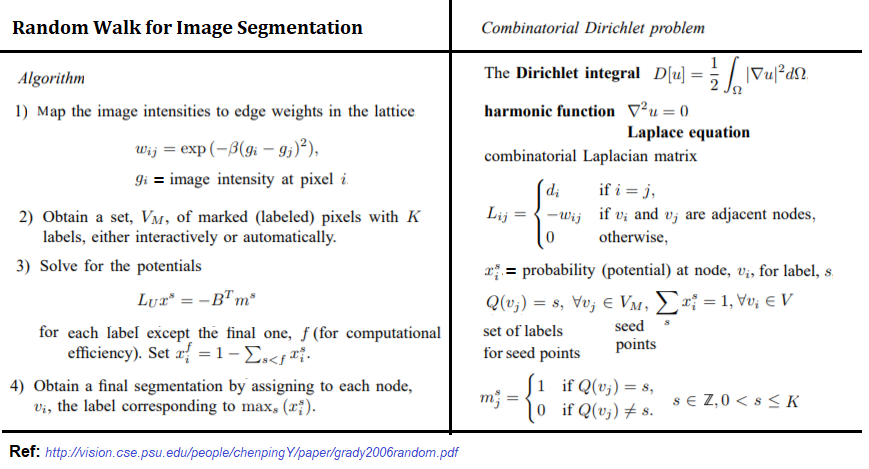

- Funkcija *random_walker()* iz *scikit-image* koristi se za primenu *Random Walk* algoritma za segmentaciju od markera. Koristićemo ulaznu fotografiju u boji, pa ćemo višekanalni parametar postaviti na ***True***.

- Parametar *return_full_prob* za istu funkciju dodeljen je ***True*** da bi se dobile sve vrednosti verovatnoće piksela koji pripadaju svakoj oznaci. Kada je ovaj parametar ***False*** (što je podrazumevani slučaj), vraća samo najverovatniju oznaku.

Algoritam rešava jednačinu beskonačne difuzije vremena, sa izvorima postavljenim na markere svake od faza (poznate kao oznake).

Faza (oznaka) koja ima najveću verovatnoću da se prvo difunduje na neobeleženi piksel je ona kojom se piksel dobija.

Jednačina difuzije rešava se minimiziranjem ponderisanog grafa laplacijanskog xTLx fotografije, x je verovatnoća da marker date faze (oznake) difuzijom prvi put dostigne piksel.


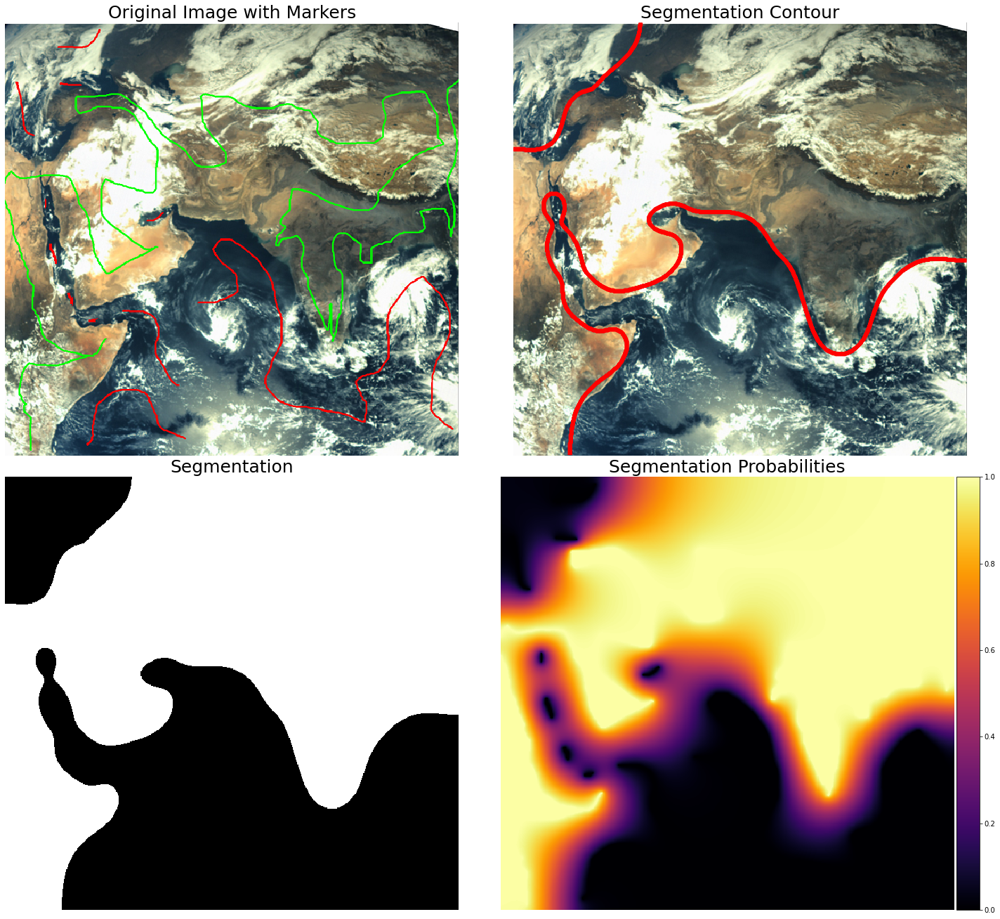

In [ ]:
# https://www.isro.gov.in/pslv-c25-mars-orbiter-mission/pictures-mars-colour-camera-mcc-onboard-india%E2%80%99s-mars-orbiter
# https://www.isro.gov.in/image-galleries
# Uvoz potrebnih biblioteka
import numpy as np  # Biblioteka za rad sa numeričkim podacima.
import matplotlib.pyplot as plt  # Biblioteka za vizualizaciju.
from mpl_toolkits.axes_grid1 import make_axes_locatable  # Alati za proširivanje osa.
from skimage.segmentation import random_walker  # Algoritam Random Walker za segmentaciju.
from skimage import img_as_float  # Funkcija za normalizaciju slika na opseg vrednosti [0, 1].
from skimage.exposure import rescale_intensity  # Alat za promenu intenziteta slike.
from skimage.io import imread  # Funkcija za čitanje slika.
from skimage.color import rgb2gray  # Pretvaranje slike u sivu skalu.

# Funkcija za dodavanje bočne skale boja (colorbar) slici.
def colorbar(mappable):
    ax = mappable.axes  # Dohvatanje osa povezane sa datim mappable objektom.
    fig = ax.figure  # Dohvatanje figure iz osa.
    divider = make_axes_locatable(ax)  # Kreiranje razdjelnika za pozicioniranje dodatnih osa.
    cax = divider.append_axes("right", size="5%", pad=0.05)  # Dodavanje prostora za bočnu skalu boja.
    return fig.colorbar(mappable, cax=cax)  # Vraćanje kreirane skale boja.

"""
Prvo treba da napravite masku za ulaznu fotografiju tako što ćete (ručno) odabrati nekoliko početnih piksela
iz prednjeg plana (objekta) i pozadine.
Za ovu primenu, početni/pozadinski pikseli su označeni zelenom, odnosno crvenom bojom.
Fotografija maske sa označenim početnim pikselima obezbeđena je za ulaznu fotografiju koja se segmentira.
"""
img = imread('images/earth_by_MCC.png')  # Učitavanje originalne slike.
mask = imread('images/earth_by_MCC_mask.png')  # Učitavanje maske sa markerima.

"""
Izdvojite piksele semena objekta i pozadine sa fotografije maske.
Kreirajte novu fotografiju markera na način na koji random_walker() funkcija očekuje
(tj. označite početne piksele sa različitim pozitivnim oznakama za svaki segment i neobeležene piksele ostavite kao nulte oznake)
"""
markers = np.zeros(img.shape[:2], np.uint8)  # Kreiranje prazne maske markera sa istim dimenzijama kao ulazna slika.
markers[(mask[..., 0] >= 200) & (mask[..., 1] <= 20) & (mask[..., 2] <= 20)] = 1  # Prednji plan (crvena boja).
markers[(mask[..., 0] <= 20) & (mask[..., 1] >= 200) & (mask[..., 2] <= 20)] = 2  # Pozadina (zelena boja).

"""
Pokrenite RandomWalker algoritam da biste segmentirali fotografije
kako biste dobili binarnu segmentaciju i pune verovatnoće dodeljene pikselima
"""
labels = random_walker(img, markers, beta=9, mode='bf', multichannel=True)  # Dobijanje binarnih oznaka piksela.
labels2 = random_walker(img, markers, beta=9, mode='bf', multichannel=True, return_full_prob=True)  # Verovatnoće za segmente.

# Iscrtajte ulazne fotografije i dobijene rezultate
# Vizualizacija rezultata
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 18), sharex=True, sharey=False)  # Kreiranje figure sa 2x2 subplotovima.
fig.subplots_adjust(0, 0, 1, 0.975, 0.01, 0.05)  # Podešavanje razmaka između subplotova.

# Prikaz originalne slike sa markerima.
ax1.imshow(mask, interpolation='nearest'), ax1.axis('off')  # Prikaz maske.
ax1.set_title('Original Image with Markers', size=25)  # Naslov za subplot.

# Prikaz segmentacije sa konturama.
ax2.imshow(img, interpolation='nearest'), ax2.contour(labels, linewidths=5, colors='r'), ax2.axis('off')  # Prikaz kontura segmentacije.
ax2.set_title('Segmentation Contour', size=25)  # Naslov za subplot.

# Prikaz segmentacije kao binarne slike.
ax3.imshow(labels, cmap='gray', interpolation='nearest'), ax3.axis('off')  # Binarna segmentacija.
ax3.set_title('Segmentation', size=25)  # Naslov za subplot.

# Prikaz verovatnoća za svaki piksel.
prob = ax4.imshow(labels2[1, ...], cmap='inferno', interpolation='nearest')  # Verovatnoće za piksele segmenta.
ax4.axis('off'), ax4.set_title('Segmentation Probabilities', size=25)  # Naslov za subplot.
colorbar(prob)  # Dodavanje bočne skale boja za verovatnoće.

#fig.colorbar(prob, ax=ax4, orientation="horizontal", pad=0.01)

# Prikaz rezultata
plt.show()

### Skin Color Detection and Segmentation with Gaussian Mixture Model // Detekcija i segmentacija boje kože pomoću Gaussovog modela smeše


Prikazaćemo upotrebu parametarskog modela (Gaussov model smeše) za otkrivanje boje i segmentiranja piksela koji odgovaraju čovekovoj koži na fotografiji.

Koristićemo skup podataka koji sadrži skup vrednosti RGB piksela i njihove oznake (bez obzira da li odgovaraju ljudskoj koži ili ne). Ovaj skup podataka je iz UCI Repozitorijuma za mašinsko učenje i prikuplja se slučajnim uzorkovanjem vrednosti R, G i B sa fotografija lica različitih starosnih grupa (mladih, srednjih godina, starih), regiona i polova. Sledeća tabela prikazuje veličinu uzoraka u skupu podataka koji će se koristiti:


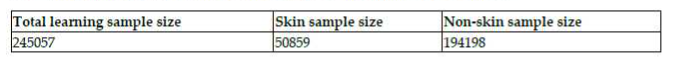

Vrednosti kanala boja uzoraka *skin/non-skin* iz našeg skupa podataka mogu se smatrati generisanim kombinacijom distribucije multimodalnih slučajnih promenljivih iz više izvora.

Za procenu ćemo koristiti konačni Gaussov model smeše (GMM) - funkcija gustine verovatnoće (*probability density function* - pdf) jer uzorci boje kože u našem skupu podataka generišu multimodalne slučajne promenljive.
Ovde pretpostavljamo da je (2D) Gaussov oblik dovoljan za svaki pojedinačni izvor. Stoga ćemo na datom skupu podataka obučiti Gaussov model smeše i proceniti parametre modela smeše koristeći algoritam maksimizacije očekivanja (EM). Kada se parametri nauče, pomoću modela ćemo predvideti koji pikseli sa nove probne fotografije pripadaju ljudskoj koži.

GMM ćemo uklopiti u pozitivne primere (*skin*), a drugi u negativne primere (*non-skin*). Za svaki piksel na fotografiji izračunaćemo rezultat (npr. verovatnoću) da je reč o ljudskoj koži, koristeći obučene GMM.

Primenićemo Gaussovog model smeše za detekciju i segmentaciju boja kože iz *scikit-learn* modula.

- Klasa *GaussianMixture* iz modula scikit-learn koristi se za primenu GMM-a. Parametri Gausove raspodele smeše mogu se proceniti (sa MLE) pomoću ove klase.

- Napravićemo dve instance klase *GaussianMixture*: jednu za *Skin* (postavljenu na *skin* uzorke), drugu za *NonSkin* (ugrađenu na *non-skin* uzorke).

- Funkcija *fit()* koristi se za procenu parametara GMM-a pomoću EM algoritma.

- Funkcija *score()* koristi se za izračunavanje log-verovatnoće svakog piksela na ulaznoj fotografiji.


In [ ]:
# Uvoz potrebnih biblioteka za analizu podataka i vizualizaciju.
import numpy as np  # Biblioteka za rad sa numeričkim podacima.
import matplotlib as mpl  # Glavna biblioteka za rad sa vizualizacijama.
import matplotlib.pyplot as plt  # Pomoćna biblioteka za crtanje grafika.
from sklearn.mixture import GaussianMixture  # Algoritam za klasifikaciju baziran na mešavinama Gaussovih modela.
import pandas as pd  # Biblioteka za rad sa tabelarnim podacima.
import seaborn as sns  # Biblioteka za napredne vizualizacije podataka.

# Učitavanje skupa podataka sa oznakama boja kože.
# `header=None` znači da datoteka nema zaglavlje kolona.
# `delim_whitespace=True` koristi razmake između podataka kao separatore.
df = pd.read_csv('images/Skin_NonSkin.txt', header=None, delim_whitespace=True)

# Dodavanje naziva kolona za lakši rad sa podacima.
df.columns = ['B', 'G', 'R', 'skin']  # `B`, `G`, `R` predstavljaju komponente boje (Blue, Green, Red), a `skin` oznaku.

# Prikaz prvih nekoliko redova datog DataFrame-a.
df.head()  # Prikazuje prvih 5 redova za pregled podataka i strukture.

,B,G,R,skin
0,74,85,123,1
1,73,84,122,1
2,72,83,121,1
3,70,81,119,1
4,70,81,119,1


/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


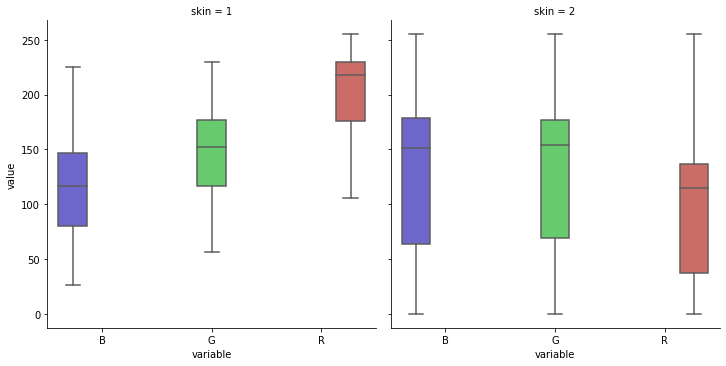

In [ ]:
# Raspored RGB vrednosti za primere skin i non-skin nacrtajte odvojeno, koristeći boxplot

# Kreiranje boxplota za analizu raspodele vrednosti RGB kanala u skupu podataka za različite klase (koža i ne-koža).
g = sns.factorplot(
    data=pd.melt(df, id_vars='skin'),  # Transformisanje DataFrame-a kako bi odgovarao formatu za `seaborn`.
    x='variable',  # Os X predstavlja ime kanala (R, G, B).
    y='value',  # Os Y predstavlja vrednosti piksela za svaki kanal.
    hue='variable',  # Boje u grafikonu će razlikovati kanale (R, G, B).
    col='skin',  # Deljenje podataka u kolone prema klasi (`1` za kožu, `2` za ne-kožu).
    kind='box',  # Prikaz raspodele podataka pomoću boxplot-a.
    palette=sns.color_palette("hls", 3)[::-1]  # Podešavanje palete boja za kanale.
)

# Prikaz generisanog grafika.
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


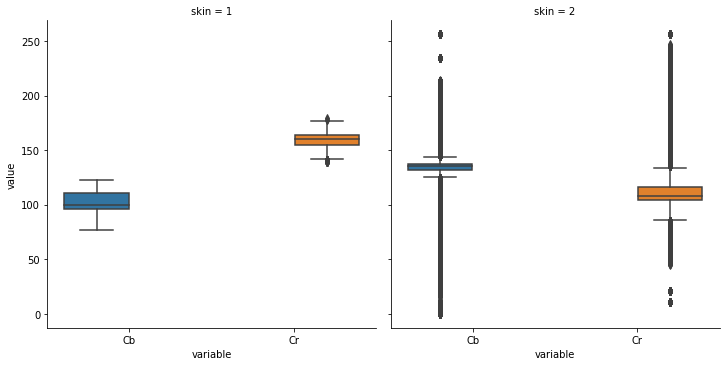

In [ ]:
"""
Nabavite vrednosti kanala Cb i Cr iz RGB vrednosti piksela
i zasebno nacrtajte njihovu raspodelu za primere skin i non-skin, koristeći boxplot
"""

#Y = .299*r + .587*g + .114*b

# Izračunavanje Cb i Cr vrednosti koristeći formule za konverziju iz RGB u YCbCr
# Cb (chrominance blue) predstavlja razliku između plave i luminance komponente
# Cr (chrominance red) predstavlja razliku između crvene i luminance komponente
df['Cb'] = np.round(128 - .168736 * df.R - .331364 * df.G + .5 * df.B).astype(int)
df['Cr'] = np.round(128 + .5 * df.R - .418688 * df.G - .081312 * df.B).astype(int)

# Uklanjanje originalnih RGB kolona, jer nam više nisu potrebne nakon računanja Cb i Cr
df.drop(['B', 'G', 'R'], axis=1, inplace=True)

# Pretvaranje DataFrame-a u format koji je pogodan za Seaborn vizualizaciju
# pd.melt pretvara 'skin', 'Cb', i 'Cr' u dugi format sa dve kolone:
# - 'variable' koja sadrži Cb ili Cr
# - 'value' koja sadrži njihove odgovarajuće vrednosti
melted_df = pd.melt(df, id_vars='skin')

# Kreiranje boxplot-a pomoću Seaborn-a
# Boxplot prikazuje raspodele vrednosti Cb i Cr za skin (1) i non-skin (2) klase
g = sns.factorplot(
    data=melted_df,          # Korišćenje transformisanog DataFrame-a
    x='variable',            # Na X osi su promenljive: 'Cb' i 'Cr'
    y='value',               # Na Y osi su njihove vrednosti
    hue='variable',          # Razlikovanje Cb i Cr pomoću boja
    col='skin',              # Kreiranje odvojenih grafika za 'skin' i 'non-skin'
    kind='box'               # Tip grafika je boxplot
)

# Prikaz rezultata
plt.show()

In [ ]:
"""
Odvojite primere obuke skin i non-skin
i uklopite dva Gaussova modela mešavine,
jedan na primerima skin i drugi na non-skin primerima, od kojih svaki koristi 4 Gaussove komponente.
"""

# Izdvajanje podataka za "skin" klasu
# Filtrira se DataFrame tako da uključuje samo redove gde je 'skin' == 1
# Zatim se uklanja kolona 'skin' kako bi ostali samo Cb i Cr kanali,
# i podaci se konvertuju u NumPy niz za dalje procesiranje
skin_data = df[df.skin == 1].drop(['skin'], axis=1).to_numpy()

# Izdvajanje podataka za "non-skin" klasu
# Isto kao za "skin", ali filtrira se gde je 'skin' == 2
not_skin_data = df[df.skin == 2].drop(['skin'], axis=1).to_numpy()

# Fitting Gaussov model mešavine (GMM) za "skin" klasu
# - `n_components=4` označava da se koriste 4 Gaussove komponente
# - `covariance_type='full'` omogućava punu kovarijacionu matricu za svaku komponentu
skin_gmm = GaussianMixture(n_components=4, covariance_type='full').fit(skin_data)

# Fitting Gaussov model mešavine (GMM) za "non-skin" klasu
# Postupak je identičan, ali se trenira na podacima iz "not_skin_data"
not_skin_gmm = GaussianMixture(n_components=4, covariance_type='full').fit(not_skin_data)

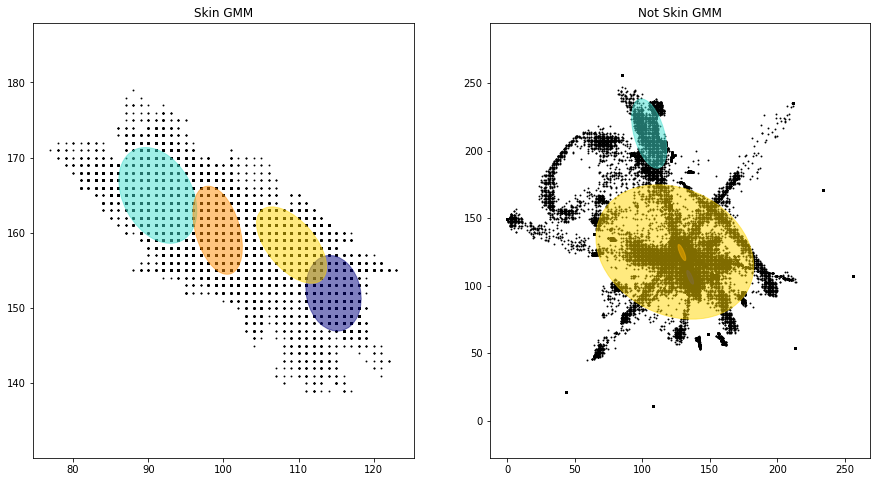

In [ ]:
# Boje za različite komponente Gaussove mešavine
colors = ['navy', 'turquoise', 'darkorange', 'gold']

# Funkcija za crtanje elipsa koje predstavljaju kovarijacione matrice komponenti GMM modela
def draw_ellipses(gmm, ax):
    """
    Crta elipse koje prikazuju Gaussove komponente modela.
    """
    for n, color in enumerate(colors):
        # Izvlačenje kovarijacione matrice za trenutnu komponentu
        covariances = gmm.covariances_[n][:2, :2]  # Uzima samo 2D podmatricu

        # Računanje sopstvenih vrednosti i sopstvenih vektora kovarijacione matrice
        v, w = np.linalg.eigh(covariances)

        # Sopstveni vektor (w) se koristi za orijentaciju elipse
        u = w[0] / np.linalg.norm(w[0])  # Normiranje prvog sopstvenog vektora
        angle = np.arctan2(u[1], u[0])  # Računanje ugla u radijanima
        angle = 180 * angle / np.pi  # Konverzija ugla u stepeni

        # Dimenzije elipse proporcionalne sopstvenim vrednostima
        v = 2. * np.sqrt(2.) * np.sqrt(v)  # Skaliranje sopstvenih vrednosti

        # Kreiranje elipse sa odgovarajućim parametrima
        ell = mpl.patches.Ellipse(gmm.means_[n, :2], v[0], v[1],
                                  180 + angle, color=color)
        ell.set_clip_box(ax.bbox)  # Ograničavanje elipse unutar ose
        ell.set_alpha(0.5)  # Postavljanje providnosti elipse
        ax.add_artist(ell)  # Dodavanje elipse na grafikon
        ax.set_aspect('equal', 'datalim')  # Postavljanje proporcija grafika

# Funkcija za crtanje GMM modela i podataka na jednoj osi
def plot_gmm(gmm, data, i, title):
    """
    Crta podatke i elipse koje predstavljaju Gaussove komponente modela.
    """
    h = plt.subplot(1, 2, i)  # Postavljanje subplot-a
    draw_ellipses(gmm, h)  # Pozivanje funkcije za crtanje elipsa
    plt.scatter(data[:, 0], data[:, 1], s=0.8, color='k')  # Crtanje tačaka podataka
    plt.title(title)  # Naslov za subplot

# Postavljanje figure i crtanje GMM modela za skin i non-skin podatke
plt.figure(figsize=(15, 8))  # Velika figura za bolju vidljivost
plot_gmm(skin_gmm, skin_data, 1, 'Skin GMM')  # GMM za skin podatke
plot_gmm(not_skin_gmm, not_skin_data, 2, 'Not Skin GMM')  # GMM za non-skin podatke
plt.show()  # Prikaz rezultata

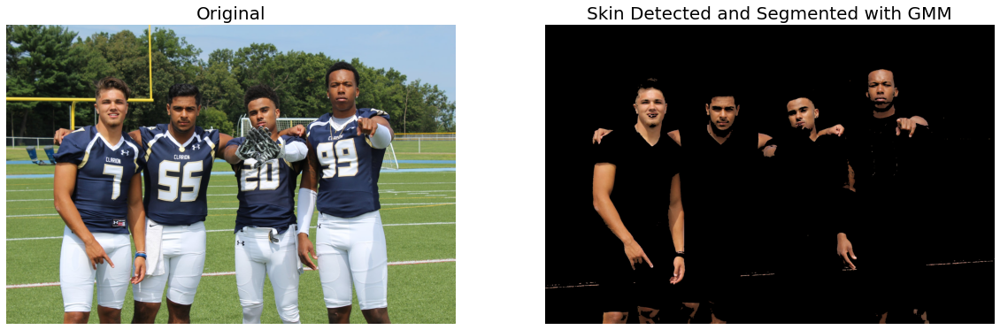

In [ ]:
from skimage.io import imread
from skimage.color import rgb2ycbcr, gray2rgb

"""
Učitajte ulaznu fotografiju koju želite da segmentirate (koja sadrži ljudska lica/kožu),
pretvorite je u YCbCr prostor boja i ocenite svaki piksel na fotografiji sa oba modela mešavine.
Maskirajte piksele gde je rezultat predviđen GMM-om kože niži (tj. pikseli za koje je predviđeno da nisu kožni)
i dobijate konačni rezultat segmentacije
"""
image = imread('images/skin.png')

# Pretvaranje slike u YCbCr prostor boja
# YCbCr prostor je često korišćen u segmentaciji slike jer je Y (luminiscencija), dok su Cb i Cr (krominance) kanali vezani za boje
proc_image = np.reshape(rgb2ycbcr(image), (-1, 3))  # Preoblikovanje slike u niz sa 3 kanala

# Ocena svakog piksela na osnovu oba Gaussova modela mešavine (skin i non-skin)
# "score_samples" vraća log-verovatnoću da je piksel iz jedne od komponenti modela
skin_score = skin_gmm.score_samples(proc_image[..., 1:])  # Ocena samo Cb i Cr kanala za skin model
not_skin_score = not_skin_gmm.score_samples(proc_image[..., 1:])  # Ocena samo Cb i Cr kanala za non-skin model

# Klasifikacija piksela: ako je verovatnoća za skin viša od non-skin, označite kao kožni
result = skin_score > not_skin_score  # True za kožu, False za non-skin

# Ob oblikovanje rezultata u istu dimenziju kao originalna slika
result = result.reshape(image.shape[0], image.shape[1])

# Primena maske na originalnu sliku: samo kožni pikseli ostaju
# Koristi "bitwise_and" da kombinuje masku sa originalnom slikom
result = np.bitwise_and(gray2rgb(255 * result.astype(np.uint8)), image)

# Prikazivanje originalne slike i rezultata segmentacije
plt.figure(figsize=(20, 10))
plt.subplot(121), plt.imshow(image), plt.axis('off'), plt.title('Original', size=20)
plt.subplot(122), plt.imshow(result), plt.axis('off'), plt.title('Skin Detected and Segmented with GMM', size=20)
plt.show()

### Medical Image Segmentation // Segmentacija medicinske fotografije

Segmentacija medicinske fotografije ima za cilj otkrivanje granica koje razdvajaju različite objekte od pozadine unutar dvodimenzionalne ili trodimenzionalne medicinske fotografije.

Medicinske fotografije su vrlo promenljive prirode, a to otežava njihovu segmentaciju. Varijacije nastaju zbog glavnih načina variranja u anatomiji čoveka i zbog različitih modaliteta fotografija koje se segmentiraju (na primer, rendgen, MRI, CT, mikroskopija, endoskopija, OCT i tako dalje) koji se koriste za dobijanje medicinskih fotografija. Dalji dijagnostički uvid može se dobiti iz rezultata segmentacije kako bi se lekarima pomoglo u donošenju odluka. Regioni kojima nedostaju ivice, odsustvo kontrasta teksture i tako dalje stvaraju glavne probleme, a predloženi su mnogi pristupi segmentaciji da bi se oni popravili. Automatsko merenje organa, brojanje ćelija i simulacije na osnovu izvučenih graničnih informacija neke su primene medicinske segmentacije.

Koristićemo Python biblioteke: *SimpleITK* i *deep learning* biblioteke, kao što je *Keras*, za segmentiranje nekoliko medicinskih fotografija.

#### **Segmentation with GMM-EM**

In [ ]:
!pip install SimpleITK

     |████████████████████████████████| 47.4MB 66kB/s 


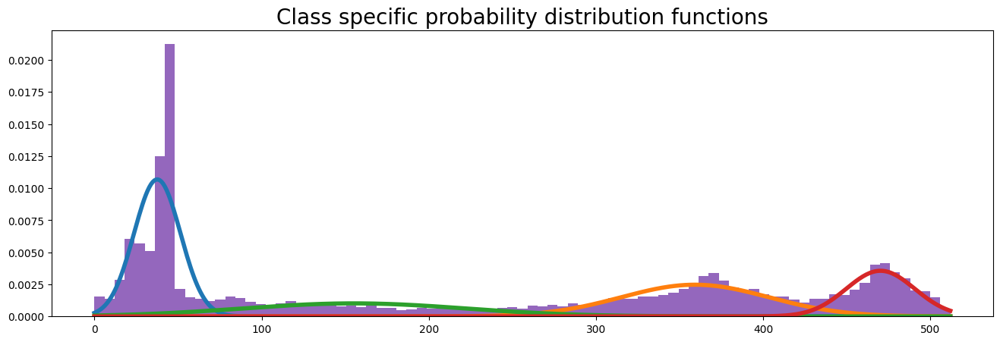

(500,) (500, 4)


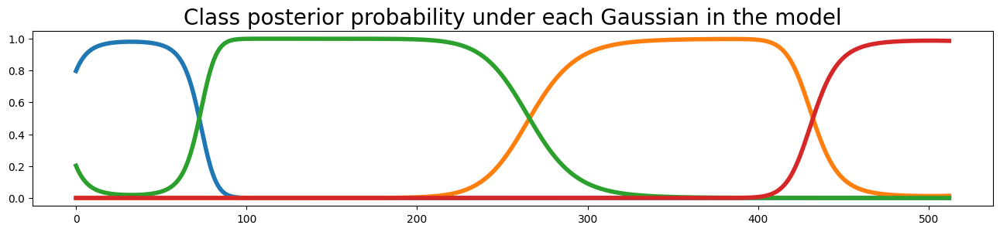

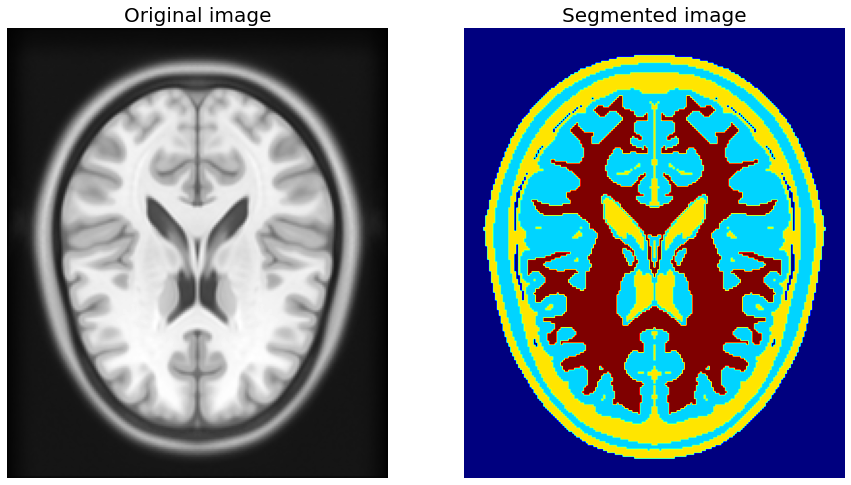

In [ ]:
#https://github.com/curiale/Medical-Image-Analysis-IPython-Tutorials
import SimpleITK as sitk
import numpy as np
import matplotlib.pylab as plt
#import matplotlib.mlab as mlab
import scipy.stats as scs
from sklearn.mixture import GaussianMixture

# Učitajte sliku dela mozga koristeći SimpleITK
# "atlas_slicez90.nii.gz" je 3D slika, učitavamo je kao 2D slice
max_int_val = 512;  # Maksimalna vrednost intenziteta
image = sitk.ReadImage("images/atlas_slicez90.nii.gz", sitk.sitkFloat32)

# Reskaliranje intenziteta slike na opseg od 0 do max_int_val
image = sitk.RescaleIntensity(image, 0.0, max_int_val)

# Pretvaranje slike u numpy niz za lakše manipulisanje podacima
image_data = sitk.GetArrayFromImage(image)

# Postavljanje parametara za model Gaussove smeše
np.random.seed(1)  # Za reproduktivnost rezultata
g = GaussianMixture(n_components=4, covariance_type='diag', tol=0.01, max_iter=100,
                n_init=1, init_params='kmeans')

# Korišćenje EM algoritma (Expectation-Maximization) za obučavanje modela na prvoj slice slici
g.fit(image_data[0].flatten().reshape(-1, 1))

# Funkcija za prikazivanje PDF-a za svaku od komponenata GMM modela
def plot_pdf_models(x, g):
    we = g.weights_  # Težine za svaku komponentu
    mu = g.means_  # Srednje vrednosti (parametar μ)
    si = np.sqrt(g.covariances_)  # Standardne devijacije (parametar σ)
    for ind in range(0, we.shape[0]):
        # Plotovanje normalne raspodele za svaku komponentu
        plt.plot(x, we[ind] * scs.norm.pdf(x, mu[ind], si[ind]), linewidth=4)

# Raspodela verovatnoće klase za svaku komponentu GMM
x = np.linspace(0, max_int_val, 500)  # Kreiranje linijskog opsega za X os
plt.figure(figsize=(16, 5), dpi=100)

# Prikazivanje PDF-a za sve komponente u modelu
plot_pdf_models(x, g)

# Histogram originalnih podataka (slike) radi poređenja sa PDF-ima
plt.hist(image_data.flatten(), bins=int(max_int_val/6), range=(0, max_int_val), density=True)
plt.title('Class specific probability distribution functions', fontsize=20)
plt.show()

# Prikazivanje posteriornih verovatnoća klase za svaku Gausovu komponentu
plt.figure(figsize=(16, 3), dpi=100)

# Ispisivanje dimenzija da proverimo da li odgovaraju
print(x.shape, g.predict_proba(x.reshape(-1,1)).shape)

# Prikazivanje posteriornih verovatnoća za svaku od komponenti
plt.plot(x, g.predict_proba(x.reshape(-1,1)), linewidth=4)
plt.title('Class posterior probability under each Gaussian in the model', fontsize=20)
plt.show()

# Segmentacija slike pomoću GMM modela
# Predviđanje klase za svaki piksel u slici
label_data = g.predict(image_data[0].flatten().reshape(-1, 1))

# Ponovno oblikovanje predviđenih oznaka u istu dimenziju kao originalna slika
label_data = label_data.reshape(image_data[0].shape)

# Prikazivanje originalne slike i segmentirane slike
plt.figure(figsize=(15,15))
plt.subplot(121), plt.imshow(image_data[0], cmap='gray'), plt.axis('off'), plt.title('Original image', size=20)
plt.subplot(122), plt.imshow(label_data, cmap='jet'), plt.axis('off'), plt.title('Segmented image', size=20)
plt.show()

#### **Tumor Segmentation with Deep Learning**

2.4.3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


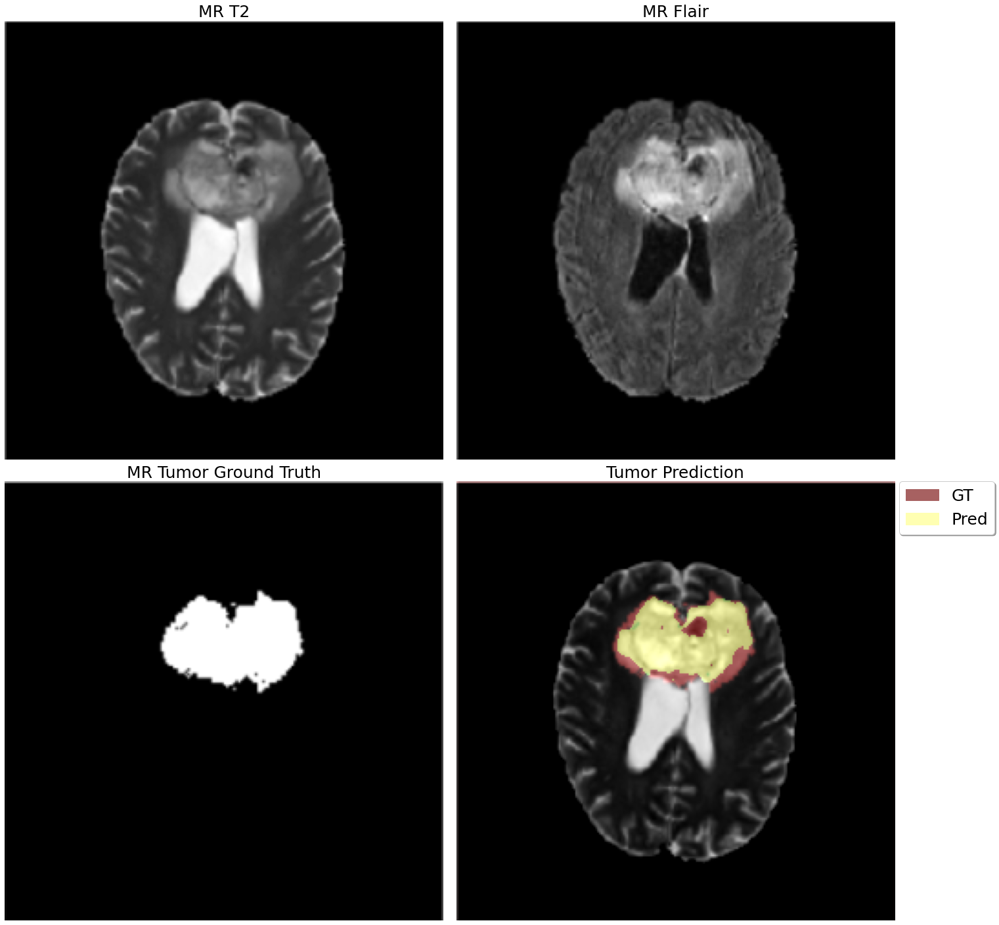

In [ ]:
# https://github.com/polo8214/Brain-tumor-segmentation-using-deep-learning/
# https://drive.google.com/file/d/1hE9It0ZOOeIuSFvt6GdiR_0cq9inWdTy/view
# weights-full-best.h5
# Importovanje potrebnih biblioteka
import keras
print(keras.__version__)  # Ispisivanje verzije Keras-a
from keras.models import model_from_json  # Importovanje funkcije za učitavanje modela iz JSON-a
from keras.utils.vis_utils import plot_model  # Za vizualizaciju modela
from skimage.io import imread  # Za učitavanje slika
from skimage.transform import resize  # Za promenjivanje veličine slika
from skimage.color import rgb2gray, gray2rgb  # Za konverziju slika u grayscale i obratno
import numpy as np  # Za rad sa nizovima
import matplotlib.pylab as plt  # Za vizualizaciju rezultata
import matplotlib.patches as mpatches  # Za kreiranje legendi u grafikonima
import pydot_ng as pydot  # Za rad sa grafičkim prikazom modela
from keras.utils.vis_utils import model_to_dot  # Za konvertovanje modela u DOT format
keras.utils.vis_utils.pydot = pydot  # Povezivanje pydot sa keras-ovim vizualizatorom
# pip3 install pydot-ng

# Učitajte strukturu modela iz .json datoteke i prethodno obučene težine iz .h5 datoteke
loaded_model_json = open('models/model.json', 'r').read()  # Učitavanje JSON fajla sa strukturom modela
model = model_from_json(loaded_model_json)  # Kreiranje modela prema JSON fajlu
model.load_weights('models/weights-full-best.h5')  # Učitavanje težina modela iz H5 datoteke

# Vizualizacija modela
plot_model(model, to_file='images/model_plot.png', show_shapes=True, show_layer_names=True)

"""
U ovom delu učitavamo MRI slike (Flair i T2) i pripremamo ih za segmentaciju tumora.
Obe slike moraju biti veličine 240x240 piksela.
Prethodna obrada uključuje promenu veličine, normalizaciju i preoblikovanje slika.
"""

# Kreiranje praznog niza za unos slike u model (1 primer sa 2 ulazna kanala)
x = np.zeros((1, 2, 240, 240), np.float32)

# Učitavanje i preprocesiranje slika Flair i T2
Flair = resize((rgb2gray(imread('images/Flair.png')).astype('float32')), (240, 240))  # Učitavanje Flair slike i konvertovanje u grayscale
T2 = resize((rgb2gray(imread('images/T2.png'))).astype('float32'), (240, 240))  # Učitavanje T2 slike i konvertovanje u grayscale

# Ground truth slika (prava oznaka tumora) takođe u grayscale
ground_truth = resize(rgb2gray(imread('images/ground_truth.png')), (240, 240))

# Normalizacija slika tako da imaju nulu kao srednju vrednost i 1 kao standardnu devijaciju
T2 = (T2 - T2.mean()) / T2.std()
Flair = (Flair - Flair.mean()) / Flair.std()

# Preoblikovanje slika za unos u model (dodavanje dimenzija kanala)
x[:, :1, :, :] = np.reshape(Flair, (1, 1, 240, 240))
x[:, 1:, :, :] = np.reshape(T2, (1, 1, 240, 240))

# Predviđanje tumora pomoću Unet modela
pred_full = model.predict(x)  # Predikcija sa modelom
pred_full = np.reshape(pred_full, (240, 240))  # Oblikovanje rezultata predikcije u 2D sliku

# Overlay (preklapanje) predikcije tumora sa T2 slikom i ground truth slikom
tumor_overlay = 0.2 * gray2rgb(T2) + 0.4 * np.array([0.25, 1, 0.25]) * gray2rgb(pred_full) + 0.4 * np.array([1, 0.25, 0.25]) * gray2rgb(ground_truth)

# Prikazivanje rezultata
plt.figure(figsize=(19, 20))
plt.gray()
plt.subplots_adjust(0, 0, 1, 0.95, 0.01, 0.05)

# Prikazivanje slika u 4 panela
plt.subplot(221), plt.title('MR T2', size=25), plt.axis('off'), plt.imshow(T2)
plt.subplot(222), plt.title('MR Flair', size=25), plt.axis('off'), plt.imshow(Flair)
plt.subplot(223), plt.title('MR Tumor Ground Truth', size=25), plt.axis('off'), plt.imshow(ground_truth)
plt.subplot(224), plt.title('Tumor Prediction', size=25), plt.axis('off'), plt.imshow(tumor_overlay)

# Kreiranje legende za oznake
colors, labels = ['#A76161', '#FFFFB2'], ['GT', 'Pred']
patches = [mpatches.Patch(color=colors[i], label=labels[i]) for i in range(len(colors))]

# Prikazivanje legende sa oznakama
plt.legend(handles=patches, bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0, prop={'size': 25}, frameon=True, shadow=True)
plt.show()

# Opis slika:
# - Osnovna istina (Ground Truth) je prikazana crvenom bojom
# - Predviđeni tumor je prikazan žutom mrljom na preklopljenoj slici

#### **Watershed Segmentation**

- Klasa *MorphologicalWatershedFromMarkers* iz *SimpleITK* modula koristi se za primenu segmentacije sliva sa morfološkim operatorima.

- Pikseli sa slivom označavaju se sa 0. Oznake izlaznih fotografija preuređene su na način da oznake objekta postaju uzastopne. Zatim se ti objekti sortiraju u odnosu na veličinu predmeta pomoću  *RelabelComponent* filtera fotografije.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


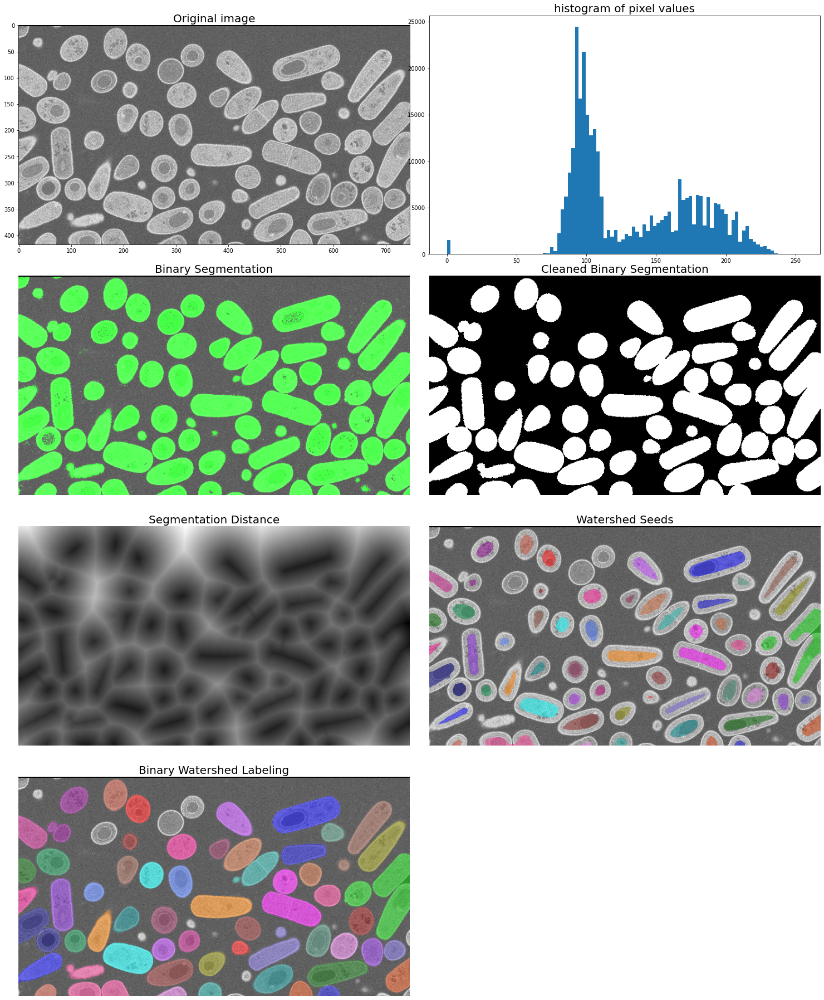

In [ ]:
import SimpleITK as sitk
import numpy as np
import matplotlib.pylab as plt

"""
Učitajte fotografiju bakterija i odvojite prvi plan (bakterije) od pozadine (smola) pomoću praga sa ručno izabranim pragom.
Koristite morfološko otvaranje i zatvaranje da biste se rešili malih komponenata/rupa.
"""

# Učitavanje slike bakterija
img = sitk.ReadImage('images/fib_sem_bacillus_subtilis_slice_118.png', sitk.sitkFloat32)

# Reskaliranje intenziteta slike (ako je potrebno, u raspon od 0 do 255)
f = sitk.RescaleIntensityImageFilter()
img = f.Execute(img)

# Prikazivanje originalne slike i histograma vrednosti piksela
plt.figure(figsize=(20, 26))
plt.gray()
plt.subplots_adjust(0, 0, 1, 0.95, 0.05, 0.05), plt.axis('off')
plt.subplot(421), plt.imshow(sitk.GetArrayFromImage(img)), plt.title('Original image', size=20)
plt.subplot(422), plt.hist(sitk.GetArrayViewFromImage(img).flatten(), bins=100), plt.title('Histogram of pixel values', size=20)

# Definisanje prag vrednosti za segmentaciju (ručno odabrani prag)
thresh_value = 120
thresh_img = img > thresh_value  # Binarna slika na osnovu praga

# Prikazivanje binarne segmentacije
plt.subplot(423), plt.imshow(sitk.GetArrayFromImage(sitk.LabelOverlay(img, thresh_img)) / 255), plt.title('Binary Segmentation', size=20), plt.axis('off')

# Čišćenje segmentacije pomoću morfoloških operacija (otvaranje i zatvaranje)
cleaned_thresh_img = sitk.BinaryOpeningByReconstruction(thresh_img, [10, 10, 10])  # Otvoreno
cleaned_thresh_img = sitk.BinaryClosingByReconstruction(cleaned_thresh_img, [10, 10, 10])  # Zatvoreno

# Prikazivanje očišćene binarne segmentacije
plt.subplot(424), plt.imshow(sitk.GetArrayFromImage(cleaned_thresh_img)), plt.title('Cleaned Binary Segmentation', size=20), plt.axis('off')

"""
Izračunajte mapu udaljenosti.
Seme na rastojanju ≥ 10 od granice predmeta označeno je kao jedinstveno.
Ponovo označite semenske objekte pomoću uzastopnih oznaka objekata dok uklanjate sve objekte veličine ≤ 15 piksela.
"""
# Izračunavanje mape udaljenosti (Maurer Distance Map)
dist_img = sitk.SignedMaurerDistanceMap(cleaned_thresh_img != 0, insideIsPositive=False, squaredDistance=False, useImageSpacing=False)

# Seme na rastojanju ≥ 10 od granice predmeta
radius = 10
seeds = sitk.ConnectedComponent(dist_img < -radius)  # Povezivanje semenskih objekata

# Relabeling (preimenovanje objekata) sa minimalnom veličinom objekta > 15 piksela
seeds = sitk.RelabelComponent(seeds, minimumObjectSize=15)

# Pokretanje watershed segmentacije sa semenskim markerima
ws = sitk.MorphologicalWatershedFromMarkers(dist_img, seeds, markWatershedLine=True)

# Maskiranje watershed linije
ws = sitk.Mask(ws, sitk.Cast(cleaned_thresh_img, ws.GetPixelID()))

# Prebacivanje slike u odgovarajući tip za prikazivanje
img = sitk.Cast(img, sitk.sitkUInt8)

# Prikazivanje rezultata: mapa udaljenosti, semena i označena watershed segmentacija
plt.subplot(425), plt.imshow(sitk.GetArrayFromImage(dist_img)), plt.title('Segmentation Distance', size=20), plt.axis('off')
plt.subplot(426), plt.imshow(sitk.GetArrayFromImage(sitk.LabelOverlay(img, seeds))), plt.title('Watershed Seeds', size=20), plt.axis('off')
plt.subplot(427), plt.imshow(sitk.GetArrayFromImage(sitk.LabelOverlay(img, ws))), plt.title('Binary Watershed Labeling', size=20), plt.axis('off')

# Prikazivanje svih slika
plt.show()

### Deep semantic segmentation // Semantička segmentacija

Semantička segmentacija odnosi se na razumevanje fotografije na nivou piksela, odnosno kada svakom pikselu na fotografiji želimo dodeliti klasu objekta (semantička oznaka). To je postupak za dobijanje grubog do finog zaključka.
Postiže precizno zaključivanje davanjem gustih predviđanja koja izvode oznake za svaki piksel. Svaki piksel je dodeljen oznaci sa klasom okolnog objekta/regiona.

Koristićemo *Caffe FCN* model deep learning-a (prethodno obučenih) za obavljanje semantičke segmentacije fotografija.

In [ ]:
!wget http://dl.caffe.berkeleyvision.org/fcn8s-heavy-pascal.caffemodel

--2021-04-20 08:18:36--  http://dl.caffe.berkeleyvision.org/fcn8s-heavy-pascal.caffemodel
Resolving dl.caffe.berkeleyvision.org (dl.caffe.berkeleyvision.org)... 128.32.162.150
Connecting to dl.caffe.berkeleyvision.org (dl.caffe.berkeleyvision.org)|128.32.162.150|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 537963413 (513M) [application/octet-stream]
Saving to: ‘fcn8s-heavy-pascal.caffemodel’

fcn8s-heavy-pascal. 100%[===================>] 513.04M  18.5MB/s    in 25s     

2021-04-20 08:19:01 (20.5 MB/s) - ‘fcn8s-heavy-pascal.caffemodel’ saved [537963413/537963413]



4.1.2
[INFO] loading model...


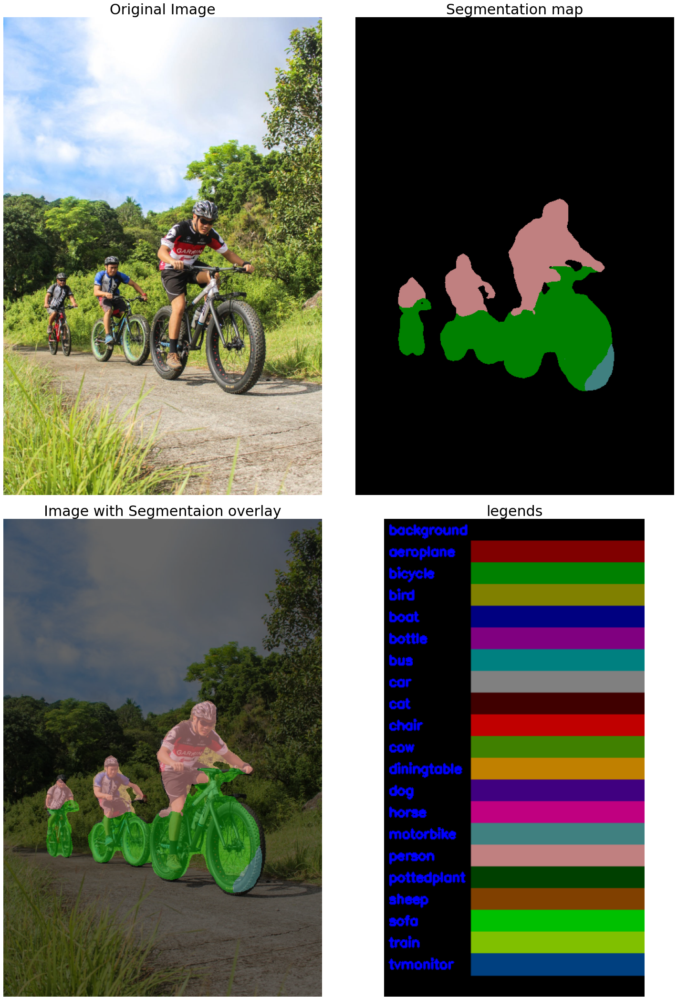

In [ ]:
# http://dl.caffe.berkeleyvision.org/fcn8s-heavy-pascal.caffemodel
# https://fossies.org/linux/opencv/samples/dnn/models.yml
import matplotlib.pylab as plt  # Učitava biblioteku za vizualizaciju u Pythonu (matplotlib)
import numpy as np  # Učitava biblioteku za rad sa numeričkim podacima (NumPy)
import imutils  # Učitava biblioteku za pomoćne funkcije vezane za obrada slika
import time  # Učitava biblioteku za rad sa vremenom
import cv2  # Učitava OpenCV biblioteku za rad sa slikama i video sadržajem
print(cv2.__version__)  # Prikazuje verziju OpenCV biblioteke

# Učitajte imena oznaka klase
lines = open('models/pascal-classes.txt').read().strip().split("\n")  # Otvara fajl sa imenima klasa i čita ga liniju po liniju
classes, colors = [], []  # Inicijalizuje prazne liste za klase i boje
for line in lines:  # Iterira kroz svaku liniju iz fajla
    words = line.split(' ')  # Razdvaja liniju u reči na osnovu razmaka
    classes.append(words[0])  # Dodaje ime klase u listu "classes"
    colors.append(list(map(int, words[1:])))  # Dodaje boje (RGB vrednosti) u listu "colors"
colors = np.array(colors, dtype="uint8")  # Pretvara listu boja u NumPy niz tipa uint8 (za piksele)
#print(classes)  # Ispisuje sve klase (komentarovano)

# Inicijalizuje vizualizaciju legende
legend = np.zeros(((len(classes) * 25) + 25, 300, 3), dtype="uint8")  # Kreira praznu sliku (legendu) sa prostorom za sve klase

# Petlja preko imena klase i boje
for (i, (className, color)) in enumerate(zip(classes, colors)):  # Iterira kroz sve klase i boje
     # Nacrtajte naziv klase + boju na legendi
     color = [int(c) for c in color]  # Pretvara RGB boje u integer vrednosti
     cv2.putText(legend, className, (5, (i * 25) + 17), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)  # Dodaje tekst (ime klase) na legendu
     cv2.rectangle(legend, (100, (i * 25)), (300, (i * 25) + 25), tuple(color), -1)  # Dodaje obojeni pravougaonik pored naziva klase

# Učitajte naš serializovani model sa diska
print("[INFO] loading model...")  # Ispisuje informaciju da se model učitava
model = cv2.dnn.readNetFromCaffe('models/fcn8s-heavy-pascal.prototxt',  # Učitava arhitekturu modela iz prototxt fajla
                                 'fcn8s-heavy-pascal.caffemodel')  # Učitava pretrenirane težine modela iz caffemodel fajla

# Učitajte ulaznu fotografiju, promenite joj veličinu i iz nje napravite blob
image = cv2.imread('images/cycling.png')  # Učitava sliku sa diska
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Konvertuje sliku iz BGR u RGB format (OpenCV koristi BGR)
image = imutils.resize(image, width=500)  # Menja veličinu slike na širinu od 500 piksela (zadržava odnos stranica)

# Izvršite prolazak unapred koristeći model segmentacije
blob = cv2.dnn.blobFromImage(image, 1, (image.shape[1], image.shape[0]))  # Priprema sliku kao blob za unos u DNN model
model.setInput(blob)  # Postavlja blob kao ulaz u model
output = model.forward()  # Pokreće unapredni prolazak kroz model i dobija izlaz

# Zaključiti ukupan broj klasa zajedno sa prostornim dimenzijama fotografije maske putem oblika izlaznog niza
(num_classes, height, width) = output.shape[1:4]  # Uzima dimenzije izlaza: broj klasa, visina i širina segmenata

"""
Naša mapa ID-a izlazne klase biće num_classes x-visina x-širina u veličini,
pa uzimamo argmax da pronađemo oznaku klase sa najvećom verovatnoćom za svaku (x,y)-koordinatnu fotografiju
"""
labels = output[0].argmax(0)  # Za svaku poziciju (x,y) uzima klasu sa najvećom verovatnoćom

# S obzirom na mapu ID-a klase, možemo mapirati svaki od ID-a klase u odgovarajuću boju
mask = colors[labels]  # Mapira ID klase u odgovarajuću boju koristeći prethodno definisane boje

"""
Promenite veličinu maske i mape klase tako da se njene dimenzije podudaraju sa originalnom veličinom ulazne fotografije
(mapu klase ovde ne koristimo ni za šta drugo, ali ovako biste je promenili za slučaj da želite da izdvojite određene piksele/​​klase)
"""
mask = cv2.resize(mask, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_NEAREST)  # Menja veličinu maske da odgovara originalnoj slici
labels = cv2.resize(labels, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_NEAREST)  # Menja veličinu mape klasa

# Izvedite ponderisanu kombinaciju ulazne fotografije sa maskom da biste formirali izlaznu vizuelizaciju
output = ((0.4 * image) + (0.6 * mask)).astype("uint8")  # Kombinuje originalnu sliku sa segmentacionom mapom za vizualizaciju
legend = imutils.resize(legend,  height=output.shape[0])  # Menja veličinu legende da se uklopi u izlaznu sliku

plt.figure(figsize=(20,30))  # Kreira figuru za prikaz svih slika
plt.subplots_adjust(left=0, right=1, bottom=0, top=0.95, wspace=0.05, hspace=0.05)  # Podesava razmake između slika
plt.subplot(221), plt.imshow(image), plt.axis('off'), plt.title('Original Image', size=30)  # Prikazuje originalnu sliku
plt.subplot(222), plt.imshow(mask), plt.axis('off'), plt.title('Segmentation map', size=30)  # Prikazuje segmentacionu mapu
plt.subplot(223), plt.imshow(output), plt.axis('off'), plt.title('Image with Segmentation overlay', size=30)  # Prikazuje sliku sa preklopljenom segmentacijom
plt.subplot(224), plt.imshow(legend), plt.axis('off'), plt.title('Legends', size=30)  # Prikazuje legendu sa klasama
plt.show()  # Prikazuje sve slike

## Dodatni primeri

### Segmentation by Thresholding

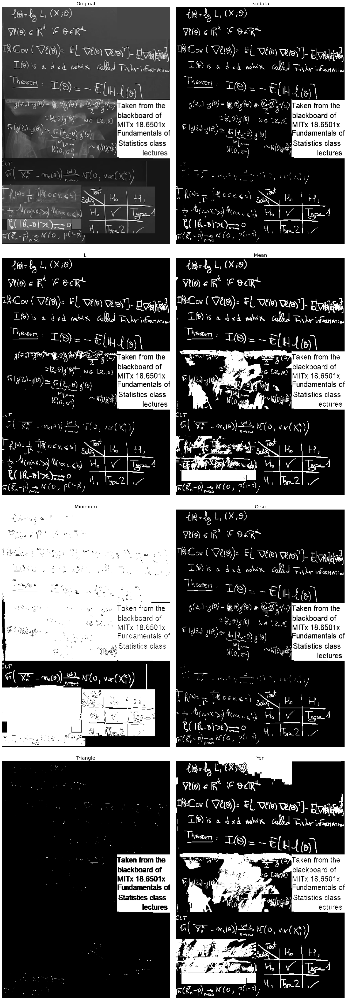

In [ ]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import try_all_threshold
image = rgb2gray(imread('images/board.png'))
plt.rcParams.update({'axes.titlesize':20})
fig, ax = try_all_threshold(image, figsize=(20, 60), verbose=False)
fig.subplots_adjust(0,0,1,0.95,0.01,0.06)
plt.show()

### Clustering digits images with SOM


In [ ]:
from minisom import MiniSom
import numpy as np
import matplotlib.pyplot as plt
from pylab import pcolor
from collections import defaultdict
from sklearn import datasets
from sklearn.preprocessing import scale

# Učitajte cifre i skalu
digits = datasets.load_digits(n_class=10)
data = digits.data  # matrica gde je svaki red vektor koji predstavlja cifru
data = scale(data)
num = digits.target  # num[i] je cifra predstavljena sa data[i]

# Napravite SOM mrežu sa 900 (30x30) neurona.
# Inicijalizujte neurone sa PCA težinama
som = MiniSom(30, 30, 64, sigma=4, learning_rate=0.5, neighborhood_function='triangle')
som.pca_weights_init(data)
print("Training...")

# Obučite SOM odabirom 5000 nasumično izabranih cifara
som.train_random(data, 5000)  # random trening
print("\n...ready!")

Training...

...ready!


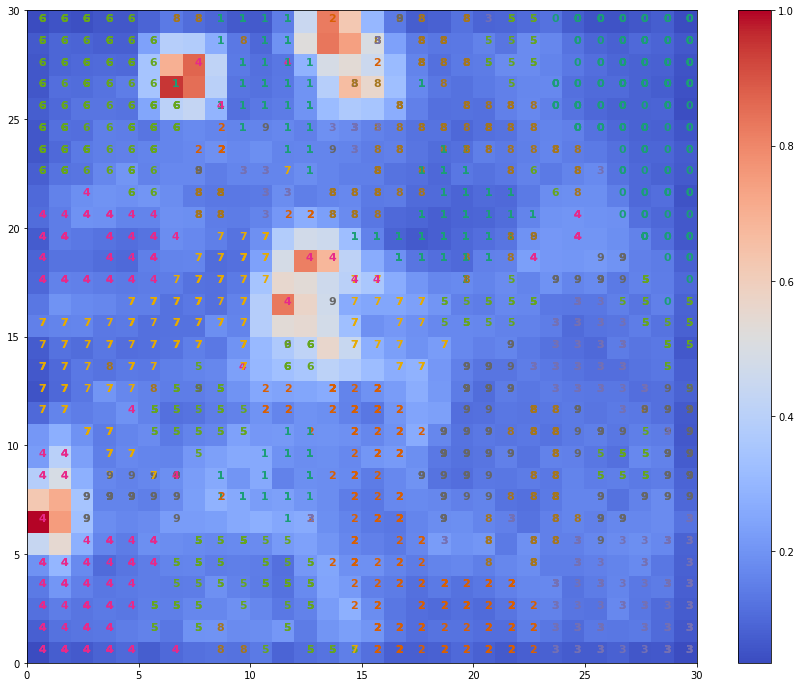

'\nNa mapi udaljenosti i traci boja (s njene desne strane) imajte na umu da ćelije (neuroni) \nkoje imaju različite cifre dodeljene susedima imaju velike vrednosti na mapi daljine \n(a ćelije koje imaju iste cifre dodeljene svim svojim susedima obično imaju male vrednosti na mapi udaljenosti).\n'

In [ ]:
"""
Nacrtajte mapu rastojanja težina
(svaka ćelija je normalizovani zbir rastojanja između neurona i njegovih suseda)
i prekrijte fotografije cifara na ćelijama (neuronima)
"""
plt.figure(figsize=(15, 12))
pcolor(som.distance_map().T, cmap='coolwarm')
plt.colorbar()
wmap = defaultdict(list)
im = 0
for x, t in zip(data, num):  # scatterplot
    w = som.winner(x)
    wmap[w].append(im)
    plt. text(w[0]+.5,  w[1]+.5,  str(t),
              color=plt.cm.Dark2(t / 10.), fontdict={'weight': 'bold',  'size': 11})
    im = im + 1
plt.axis([0, som.get_weights().shape[0], 0,  som.get_weights().shape[1]])
plt.show()

"""
Na mapi udaljenosti i traci boja (s njene desne strane) imajte na umu da ćelije (neuroni)
koje imaju različite cifre dodeljene susedima imaju velike vrednosti na mapi daljine
(a ćelije koje imaju iste cifre dodeljene svim svojim susedima obično imaju male vrednosti na mapi udaljenosti).
"""

[359, 859, 1370]


<Figure size 432x288 with 0 Axes>

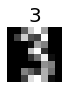

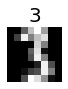

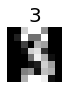

In [ ]:
# Nacrtajte cifre koje su mapirane u određenu ćeliju na koordinatama (23,15) na mreži

print(wmap[23,15])
# [581, 598, 1361] # 3 digits assigned to node (23,15)
plt.gray()
for index in wmap[23,15]:
    plt.figure(figsize=(1,1))
    plt.imshow(np.reshape(digits.images[index], (8,-1)))
    plt.title(digits.target[index])
    plt.axis('off')
    plt.show()

## Korisni linkovi

1. https://mahotas.readthedocs.io/en/latest/thresholding.html

2. https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=4310039

3. http://www.math.le.ac.uk/people/ag153/homepage/AkindukoMirkesGorbanInfTech2016.pdf

4. https://genome.tugraz.at/MedicalInformatics2/SOM.pdf

5. http://www.cs.bham.ac.uk/~jxb/NN/l16.pdf


## Reference

1.   [Python Image Processing Cookbook](https://www.amazon.com/Python-Image-Processing-Cookbook-processing-ebook/dp/B084ZN7Y5F), Sandipan Dey

## TO DO

### Zadatak 1

- Pokušajte sa višenamenskom segmentacijom sa više od dve labele koristeći *RandomWalk* segmentaciju.

- Fotografiju kostiju segmentirajte odgovarajućim markerima piksela semena.

- Pokrenite segmentaciju i nacrtajte sve ulazne/izlazne fotografije.

- Potrebni resursi ('images/**CT_bones.png**' i 'images/**CT_bones_mask.png**')

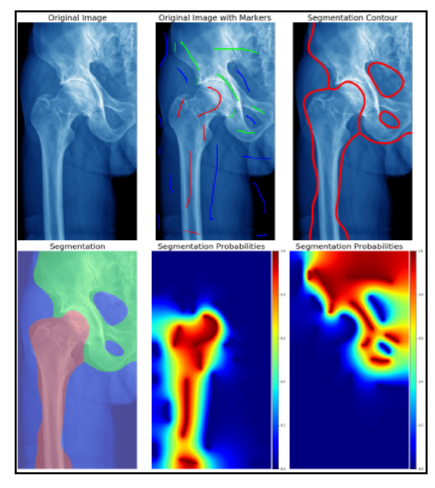